# End-to-End Pipeline Demo: Quality Report

---

## Objective

This notebook provides information about about the models training on the university's supercomputer BEM2. It also runs the complete pipeline (`murawa.services.analysis.pipeline.analyze_frame_run` / `analyze_match_run`) on a single frame and on a short clip, and evaluates the **whole chain**: detection -> ByteTrack tracking -> team assignment -> clip-level team stabilization -> rendered overlay video -> `prediction_summary.json` (consumed by the *Przeglądaj analizy* / Minimapa view in Streamlit).

Concretely, the notebook:

- describes the final pipeline from input video/frame to `outputs/predictions/` and `outputs/videos/`,
- runs it on at least one frame and one clip (<= 60 s, the limit from `configs/project.yaml`),
- inspects detection, tracking, and team-assignment quality on these examples,
- shows the `minimap_entities` payload that backs the Streamlit Minimapa tab,
- collects successes, failures, and limitations of the current demo version,
- gives the exact commands a user would run to reproduce this analysis on their own clip.

This report does not repeat per-class mAP/F1 tables, those are in the model-comparison notebooks. The focus here is qualitative and pipeline-level: does the demo, as a whole, produce something usable?

## 1. The process of training the models

### 1.1. Data Sources

For a training process, two data sources were used:
- `soccernet`: https://www.soccer-net.org/data
- `FootballVisionAI`: https://universe.roboflow.com/footballvisionai/playersdetection-2-vfmys/dataset/1

### 1.2. Using university computational resources
https://wcss.pl/uslugi/25/przetwarzanie-danych-na-superkomputerze/

![WCSS Logo](../data/screenshots_archive/WCSS_logo_200x200.png)

The learning process required working on thousands of images, so it was necessary to receive the access to a supercomputer, which would allow to train the models. Thanks to the `WCSS`, after our team successfully registered on the website, and applied for the resources, we were able to use the computational power of BEM2.

![WCSS project](../data/screenshots_archive/bem_project.png)

![WCSS team](../data/screenshots_archive/bem_team.png)

Gaining the access and properly using the `BEM2` sometimes required direct contatct with administrators, who are transparent about reported errors with the environment. Frequent maintenance work, which resulted in a lack of access to computing power, proved to be an obstacle to training the models. However, finally, after being able to use the computational power offered by the supercomputer, we trained all the models, which required multiple runs and some time:

![Bem log](../data/screenshots_archive/BEM2.jpg)

![BEM 3](../data/screenshots_archive/BEM3.jpg)

An interesting feature provided by the `WCSS` service is the `Grafana` technology, which allowed us to monitor the usage of the computer resources.

![Bem log](../data/screenshots_archive/grafana.png)

For the resource managment, we used SLURM. We shared the PD-info which was mapped to the common disc. Our final disc usage is shown below. We used about half of the accessed storage.

![Bem log](../data/screenshots_archive/used_resources.png)

The decision to use the university's resources was crucial for the further development of the project, because we would not be able to obtain proper results on our local devices. 

## 2. Setup

In [1]:
import json
import shutil
import subprocess
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display, Video, Image as IPyImage

plt.rcParams.update({
    "figure.dpi": 130,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "axes.grid": True,
    "grid.alpha": 0.3,
    "grid.linestyle": "--",
    "font.size": 11,
})

pd.set_option("display.float_format", "{:.4f}".format)
pd.set_option("display.max_columns", 20)

TEAM_COLORS = {"team_a": "#2563eb", "team_b": "#dc2626", "unassigned": "#9ca3af"}
CLASSES = ["player", "goalkeeper", "referee", "ball"]

In [18]:
PROJECT_ROOT = Path("..").resolve()

from murawa.settings import (
    MAX_VIDEO_DURATION_SECONDS,
    DEFAULT_SAMPLE_FPS,
    OUTPUTS_PREDICTIONS,
    OUTPUTS_VIDEOS,
)

print(f"Project root: {PROJECT_ROOT}")
print(f"Max demo clip duration (configs/project.yaml): {MAX_VIDEO_DURATION_SECONDS} s")
print(f"Default sample FPS: {DEFAULT_SAMPLE_FPS}")

Project root: D:\MURAWA\football-video-action-recognition
Max demo clip duration (configs/project.yaml): 60.0 s
Default sample FPS: 3


## 3. The final pipeline

The end-to-end pipeline is implemented in `src/murawa/services/analysis/` and exposed through two public entry points re-exported from `murawa.services.analysis.pipeline`:

- `analyze_frame_run(project_root, run_name, input_path=...)` for a single image,
- `analyze_match_run(project_root, run_name, input_path=..., sample_fps=...)` for a video clip.

Both are wrapped by `scripts/predict.py` (CLI) and by the *Analizuj klatkę* / *Analizuj mecz* Streamlit views (`app/views/frame_page.py`, `app/views/match_page.py`).

### 3.1 Frame mode (`mode="frame"`)

1. **Resolve run & input**: picks a trained checkpoint (`models/checkpoints/<run_name>/model.pt`) and an image input (uploaded file or a fallback test image for the dataset variant).
2. **Model inference**: `model.predict(...)` runs YOLO or RF-DETR on the frame and returns raw detections (bbox, class, confidence).
3. **Primary-ball filter**: if more than one `ball` detection is found, only the highest-confidence one is kept (`_select_primary_ball_detections`).
4. **Team assignment**: `assign_teams_to_frame` clusters jersey colors per detected player/goalkeeper/referee box and assigns `team_a` / `team_b` (or leaves referees unassigned), and builds `minimap_entities`.
5. **Render & persist**: `write_preview_assets` draws an annotated frame (`preview/frame_preview.jpg`) and `write_team_assignment_debug_preview` writes a crop sheet (`preview/team_assignment_crops.jpg`). Everything is written to `outputs/predictions/<run_name>/prediction_summary.json`.

### 3.2 Match / video mode (`mode="match"`)

1. **Resolve run & validate input**: checks the video exists, has a supported suffix, and is within the inference limits from `configs/project.yaml` (`max_video_duration_seconds`).
2. **Frame extraction**: `extract_sampled_frames` samples the clip at `sample_fps` (default 3) into temporary frame images.
3. **Model inference**: the same YOLO/RF-DETR adapter runs `predict_frames` over every sampled frame.
4. **Tracking**: `track_frame_batches` attaches ByteTrack `track_id`s across the sampled timeline.
5. **Team assignment**: `assign_teams_to_frame` runs per sampled frame, producing per-frame `team_a`/`team_b` labels and a `minimap_entities` snapshot.
6. **Clip-level team stabilization**: `stabilize_match_team_assignments_with_clip_prototypes` builds clip-wide jersey-color prototypes so a track doesn't flip teams mid-clip.
7. **Smoothing & primary ball**: `smooth_tracked_batches` majority-votes `class`/`team` per track over a 15 s window and stabilizes bounding-box jitter; `select_primary_ball_batches` keeps at most one ball per frame using short-term memory.
8. **Render & persist**: `write_annotated_match_video` draws boxes, track IDs, and team colors onto every sampled frame and writes two videos (`outputs/videos/<analysis_id>.webm` for in-app preview, `outputs/videos/<analysis_id>.mp4` for download), plus `outputs/predictions/<run_name>/<analysis_id>/prediction_summary.json`.

### 3.3 What ends up in `prediction_summary.json`

| Key | Content |
|---|---|
| `stats` | `total_detections`, `classes` (per-class counts), `mean_confidence`, `track_count`, `tracked_detections`, `team_counts` (match mode) |
| `tracking` | tracking method, `track_count`, smoothing window, primary-ball policy |
| `team_assignment` | method, per-frame and clip-level team summaries, `team_counts` |
| `minimap_entities` | list of entities (team, role, normalized position) for the Streamlit Minimapa tab -- **frame mode only**, empty `[]` in match mode in the current implementation |
| `preview_assets` / `debug_preview_assets` | paths to annotated frame / team-assignment crop sheet (frame mode) |
| `video_path`, `download_video_path` | annotated video paths (match mode) |
| `detections` | the full per-detection list (bbox, class, confidence, `track_id`, `team`, ...) |

> **Note on the minimap.** In the current implementation `minimap_entities` is a flat JSON list of entities, not a separate graphical minimap layer drawn on the video. It is populated by `assign_teams_to_frame` in frame mode; the match-mode payload always sets it to `[]`. On a real match clip the Minimapa tab can therefore show an empty list -- this is a known limitation of the demo, discussed in Section 7.

## 4. Test data

The pipeline is exercised on the project's bundled demo clip, [`data/videos/messi_real.mp4`](../data/videos/messi_real.mp4), used the same way as in the model-comparison notebook. It is short enough to respect the `max_video_duration_seconds` limit (60 s) from `configs/project.yaml`.

- **Frame example**: the first sampled frame of the clip (extracted on the fly below), used for `mode="frame"`.
- **Clip example**: the same clip, used for `mode="match"` with the default `sample_fps`.
- **Run used**: the latest available `extended`-variant run for each model (`yolo-extended-full-v2`, `rfdetr-extended-full-v2`), matching the runs used in the model-comparison report so results stay comparable.

If a trained checkpoint or a previous prediction is not available in this environment, the corresponding cells fall back to printing the exact command needed to generate it (see Section 8 for the full user-facing recipe). The notebook is designed to run top to bottom either way.

In [3]:
DEMO_VIDEO = PROJECT_ROOT / "data" / "videos" / "messi_real.mp4"
PRED_ROOT = PROJECT_ROOT / OUTPUTS_PREDICTIONS
VIDEOS_ROOT = PROJECT_ROOT / OUTPUTS_VIDEOS

RUNS_TO_CHECK = ["yolo-extended-full-v2", "rfdetr-extended-full-v2"]

print(f"Demo video exists: {DEMO_VIDEO.exists()} -> {DEMO_VIDEO}")
for run_name in RUNS_TO_CHECK:
    ckpt = PROJECT_ROOT / "models" / "checkpoints" / run_name / "model.pt"
    print(f"Checkpoint {run_name}: {'found' if ckpt.exists() else 'MISSING'} -> {ckpt}")

Demo video exists: True -> D:\MURAWA\football-video-action-recognition\data\videos\messi_real.mp4
Checkpoint yolo-extended-full-v2: found -> D:\MURAWA\football-video-action-recognition\models\checkpoints\yolo-extended-full-v2\model.pt
Checkpoint rfdetr-extended-full-v2: found -> D:\MURAWA\football-video-action-recognition\models\checkpoints\rfdetr-extended-full-v2\model.pt


## 5. Evaluation criteria

Quantitative metrics like mAP or per-class F1 are out of scope here, because they are already covered by the model-comparison notebooks under controlled evaluation settings. For an end-to-end demo pipeline running on a single uncontrolled clip, the more informative questions are:

1. **Does the pipeline run start to finish without errors** on a single frame and on a <=60 s clip, and does it produce all expected artifacts (`prediction_summary.json`, annotated video, preview images)?
2. **Detection plausibility**: do the detected boxes and counts (`stats.classes`, `stats.total_detections`) look reasonable for the visible scene (right order of magnitude for players/ball, no wildly implausible counts)?
3. **Tracking stability**: how many distinct `track_id`s does `stats.track_count` report relative to the number of visible people, and do IDs stay reasonably stable across the sampled timeline (`tracking.track_count`, `tracking.tracked_detections`)?
4. **Team assignment quality**: do `team_assignment.team_counts` / `stats.team_counts` look balanced and consistent with the jersey colors visible in the `debug_preview_assets` crop sheet?
5. **Minimap payload**: what does `minimap_entities` actually contain for this clip, and is it consistent with the note in Section 3.3 (empty in match mode)?
6. **Visual end result**: does the rendered annotated video look usable as a demo (boxes, labels, team colors), independent of raw detection accuracy?

These are inspected qualitatively, supported by the numeric fields already computed by the pipeline (no extra metric code is introduced).

## 6. Running the pipeline

### 6.1 Frame mode

The cell below runs `analyze_frame_run` on the first frame of the demo clip using the `yolo-extended-full-v2` run. If the checkpoint or the input frame is missing, it prints the equivalent CLI command instead of failing.

In [4]:
FRAME_RUN_NAME = "yolo-extended-full-v2"
FRAME_INPUT_PATH = PROJECT_ROOT / "outputs" / "_demo_frame.jpg"

frame_result = None
ckpt_path = PROJECT_ROOT / "models" / "checkpoints" / FRAME_RUN_NAME / "model.pt"

if not DEMO_VIDEO.exists():
    print(f"Demo video not found at {DEMO_VIDEO} -- skipping frame-mode run.")
elif not ckpt_path.exists():
    print(f"Checkpoint missing for {FRAME_RUN_NAME} -- skipping frame-mode run.")
    print("Train it first, e.g.:")
    print(f"  python scripts/train.py --model yolo --dataset-variant extended --profile full "
          f"--name {FRAME_RUN_NAME}")
else:
    import cv2

    FRAME_INPUT_PATH.parent.mkdir(parents=True, exist_ok=True)
    cap = cv2.VideoCapture(str(DEMO_VIDEO))
    ok, frame = cap.read()
    cap.release()
    if not ok:
        print(f"Could not read a frame from {DEMO_VIDEO}.")
    else:
        cv2.imwrite(str(FRAME_INPUT_PATH), frame)
        from murawa.services.analysis.pipeline import analyze_frame_run

        frame_result = analyze_frame_run(
            project_root=PROJECT_ROOT,
            run_name=FRAME_RUN_NAME,
            input_path=str(FRAME_INPUT_PATH),
        )
        print("status:", frame_result["status"])
        print("summary_path:", frame_result.get("summary_path"))
        print("preview_assets:", frame_result.get("preview_assets"))
        print("debug_preview_assets:", frame_result.get("debug_preview_assets"))

status: ok
summary_path: D:\MURAWA\football-video-action-recognition\outputs\predictions\yolo-extended-full-v2\prediction_summary.json
preview_assets: ['D:\\MURAWA\\football-video-action-recognition\\outputs\\predictions\\yolo-extended-full-v2\\preview\\frame_preview.jpg']
debug_preview_assets: ['D:\\MURAWA\\football-video-action-recognition\\outputs\\predictions\\yolo-extended-full-v2\\preview\\team_assignment_crops.jpg']


### 6.1.1 Input frame

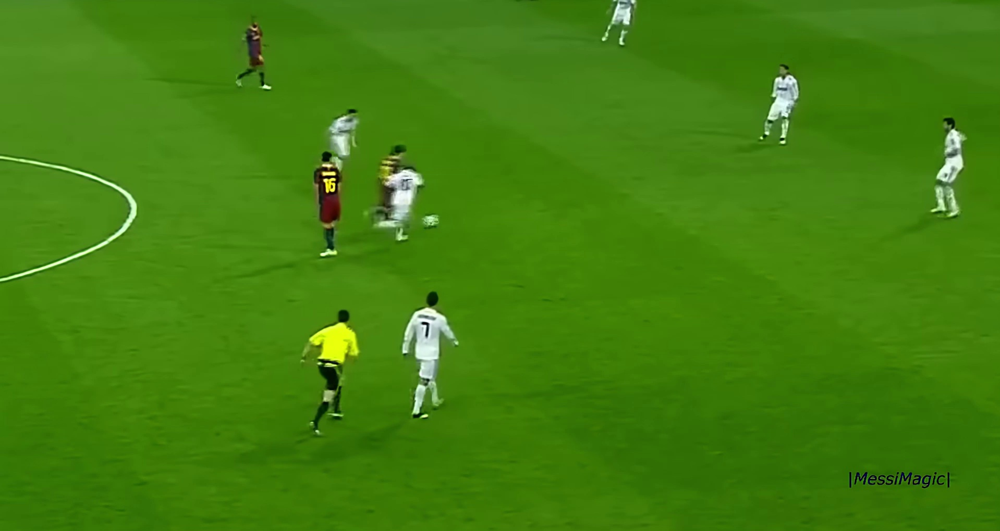

In [5]:
if FRAME_INPUT_PATH.exists():
    display(IPyImage(filename=str(FRAME_INPUT_PATH), width=640))
else:
    print("No input frame available.")

### 6.1.2 Detection + team-assignment overlay (frame mode)

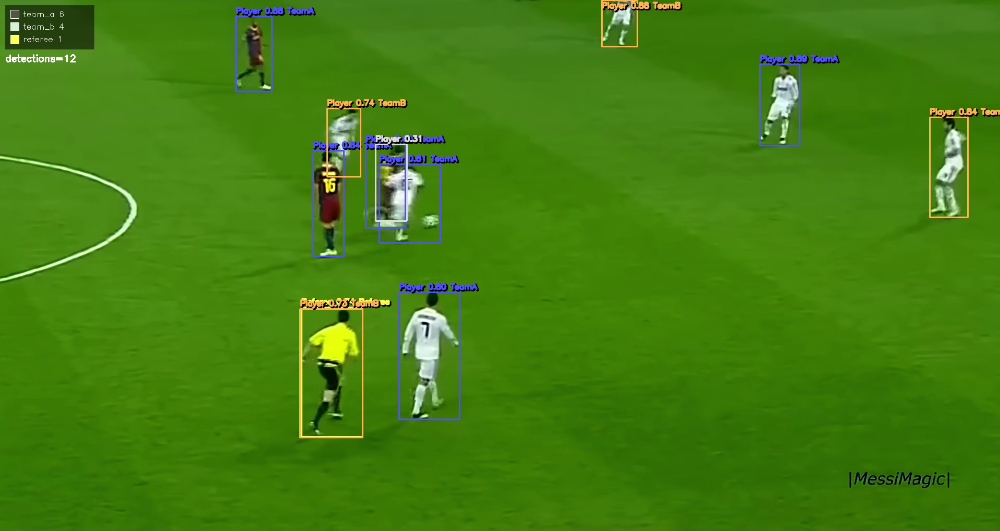

In [6]:
if frame_result and frame_result["status"] == "ok" and frame_result.get("preview_assets"):
    for asset_path in frame_result["preview_assets"]:
        display(IPyImage(filename=asset_path, width=640))
else:
    print("No frame-mode preview available -- run the cell in 6.1 first "
          "(requires a trained checkpoint).")

### 6.1.3 Team-assignment debug crops

Each tile shows a jersey-region crop, the assigned class, the assigned team label and confidence, and the dominant jersey color used for clustering.

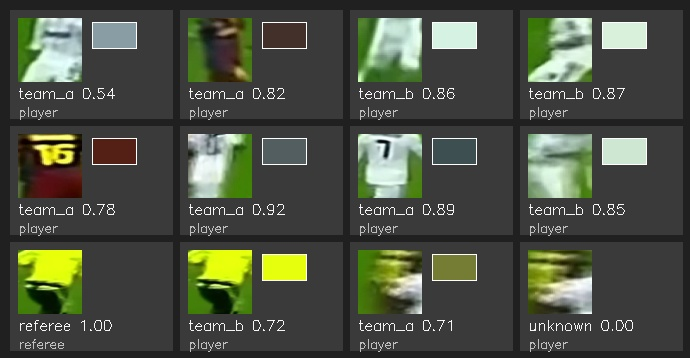

In [7]:
if frame_result and frame_result["status"] == "ok" and frame_result.get("debug_preview_assets"):
    for asset_path in frame_result["debug_preview_assets"]:
        display(IPyImage(filename=asset_path, width=640))
else:
    print("No debug preview available -- run the cell in 6.1 first.")

### 6.1.4 Frame-mode stats, team assignment, and minimap entities

In [8]:
if frame_result and frame_result["status"] == "ok":
    print("stats:")
    print(json.dumps(frame_result["stats"], indent=2))
    print()
    print("team_assignment:")
    print(json.dumps(frame_result["team_assignment"], indent=2))
    print()
    print("minimap_entities (frame mode):")
    print(json.dumps(frame_result["minimap_entities"], indent=2))
else:
    print("No frame-mode result available.")

stats:
{
  "total_detections": 12,
  "classes": {
    "player": 11,
    "referee": 1
  },
  "mean_confidence": 0.7625604594747225,
  "track_count": 0,
  "tracked_detections": 0
}

team_assignment:
{
  "enabled": true,
  "method": "jersey_color_kmeans_mvp",
  "player_classes": [
    "goalkeeper",
    "player"
  ],
  "referee_classes": [
    "referee"
  ],
  "parameters": {
    "min_player_box_width_px": 15,
    "min_player_box_height_px": 35,
    "min_player_confidence": 0.45
  },
  "team_counts": {
    "referee": 1,
    "team_a": 6,
    "team_b": 4,
    "unknown": 1
  },
  "team_colors_bgr": {
    "team_a": [
      66,
      86,
      83
    ],
    "team_b": [
      214,
      242,
      216
    ]
  },
  "minimap_entities": 12,
  "notes": [
    "Team assignment is heuristic and based on jersey color crops.",
    "Referee is kept separately when the model predicts class='referee'.",
    "Track smoothing is applied when track_id is available."
  ]
}

minimap_entities (frame mode):
[
  {


### 6.2 Match (video clip) mode

The cell below runs `analyze_match_run` on the full demo clip with the `rfdetr-extended-full-v2` run and the default `sample_fps`. The clip is well under the 60 s `max_video_duration_seconds` limit from `configs/project.yaml`. As with frame mode, if the checkpoint is missing the cell prints the command needed to produce it instead of failing.

In [9]:
MATCH_RUN_NAME = "rfdetr-extended-full-v2"

match_result = None
ckpt_path = PROJECT_ROOT / "models" / "checkpoints" / MATCH_RUN_NAME / "model.pt"

if not DEMO_VIDEO.exists():
    print(f"Demo video not found at {DEMO_VIDEO} -- skipping match-mode run.")
elif not ckpt_path.exists():
    print(f"Checkpoint missing for {MATCH_RUN_NAME} -- skipping match-mode run.")
    print("Train it first, e.g.:")
    print(f"  python scripts/train.py --model rf --dataset-variant extended --profile full "
          f"--name {MATCH_RUN_NAME}")
else:
    from murawa.services.analysis.pipeline import analyze_match_run

    match_result = analyze_match_run(
        project_root=PROJECT_ROOT,
        run_name=MATCH_RUN_NAME,
        input_path=str(DEMO_VIDEO),
        sample_fps=DEFAULT_SAMPLE_FPS,
    )
    print("status:", match_result["status"])
    print("summary_path:", match_result.get("summary_path"))
    print("video_path:", match_result.get("video_path"))
    print("download_video_path:", match_result.get("download_video_path"))
    print("sampled_frames:", match_result.get("sampled_frames"))

[2026-06-13 13:31:03] [WARNING] rf-detr - Using a different number of positional encodings than DINOv2, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
[2026-06-13 13:31:03] [WARNING] rf-detr - Using patch size 16 instead of 14, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
[2026-06-13 13:31:03] [WARNING] rf-detr - Checkpoint has 4 classes but model is configured for 90. Using checkpoint class count (4). Pass num_classes=4 to suppress this warning.
[2026-06-13 13:31:03] [WARNING] rf-detr - load_pretrain_weights: args.num_queries absent; inferred ckpt_num_queries=300 from tensor rows 3900 ÷ ckpt_group_detr=13.
[2026-06-13 13:31:04] [WARNING] rf-detr - Model is not optimized for inference. Latency may be higher than expected. You can optimize the model for inference by calling model.optimize_for_inference().
[transformers] `use_return_dict` is de

status: ok
summary_path: D:\MURAWA\football-video-action-recognition\outputs\predictions\rfdetr-extended-full-v2\match_20260613-112958_7c178df9\prediction_summary.json
video_path: D:\MURAWA\football-video-action-recognition\outputs\videos\match_20260613-112958_7c178df9.webm
download_video_path: D:\MURAWA\football-video-action-recognition\outputs\videos\match_20260613-112958_7c178df9.mp4
sampled_frames: 22


If running the pipeline above is too slow for this session, the cell below falls back to the **most recent existing** `prediction_summary.json` with `mode == "match"` for either run, so the rest of the notebook can still be inspected.

In [10]:
def load_latest_match_summary(run_names, pred_root: Path):
    for run_name in run_names:
        run_dir = pred_root / run_name
        if not run_dir.exists():
            continue
        candidates = sorted(
            run_dir.rglob("prediction_summary.json"),
            key=lambda p: p.stat().st_mtime,
            reverse=True,
        )
        for candidate in candidates:
            with open(candidate) as f:
                data = json.load(f)
            if data.get("mode") == "match" and data.get("status") == "ok":
                return data, candidate
    return None, None

if match_result is None or match_result.get("status") != "ok":
    fallback, fallback_path = load_latest_match_summary(
        ["rfdetr-extended-full-v2", "yolo-extended-full-v2"], PRED_ROOT,
    )
    if fallback is not None:
        print(f"Using existing prediction summary: {fallback_path}")
        match_result = fallback
    else:
        print("No match-mode prediction summary available (neither freshly generated nor cached).")
        print("Run scripts/predict.py with --mode match as shown in Section 8 to generate one.")

### 6.2.1 Source clip

In [11]:
if DEMO_VIDEO.exists():
    display(Video(str(DEMO_VIDEO), embed=True, width=640))
else:
    print(f"Video not found at {DEMO_VIDEO}.")

### 6.2.2 Annotated output video

Annotated videos are written with `mp4v`, which most browsers cannot decode inside an HTML5 `<video>` tag. The helper below transcodes to H.264 with `ffmpeg` (if available) before displaying, mirroring the approach used in the model-comparison notebook.

In [12]:
def display_playable_video(src_path: Path, width: int = 640):
    if not src_path.exists():
        print(f"Video not found at {src_path}.")
        return
    if shutil.which("ffmpeg") is None:
        print(f"ffmpeg not found -- cannot transcode {src_path.name} for playback.")
        print("Install ffmpeg, or open the file directly from outputs/videos/.")
        return

    h264_path = src_path.with_name(src_path.stem + "_h264.mp4")
    if not h264_path.exists() or h264_path.stat().st_mtime < src_path.stat().st_mtime:
        result = subprocess.run(
            ["ffmpeg", "-y", "-i", str(src_path),
             "-c:v", "libx264", "-pix_fmt", "yuv420p", "-movflags", "+faststart",
             str(h264_path)],
            capture_output=True, text=True,
        )
        if result.returncode != 0:
            print(f"ffmpeg transcoding failed for {src_path.name}:")
            print(result.stderr[-500:])
            return

    display(Video(str(h264_path), embed=True, width=width))

if match_result and match_result.get("status") == "ok":
    download_video_path = match_result.get("download_video_path")
    if download_video_path:
        display_playable_video(Path(download_video_path))
    else:
        print("No download_video_path in the result.")
else:
    print("No match-mode result available -- nothing to display.")

## 7. Results

### 7.1 Detection and tracking overview

`stats` and `tracking` from `prediction_summary.json` summarize detection counts, mean confidence, and `track_count` -- the number of distinct ByteTrack IDs seen across the sampled timeline.

In [13]:
if match_result and match_result.get("status") == "ok":
    stats = match_result.get("stats", {})
    tracking = match_result.get("tracking", {})
    meta = match_result.get("video_metadata", {})

    overview = pd.DataFrame([{
        "Model": match_result.get("model"),
        "Dataset variant": match_result.get("dataset_variant"),
        "Sampled frames": match_result.get("sampled_frames"),
        "Sample FPS": match_result.get("sample_fps"),
        "Clip duration (s)": meta.get("duration_seconds"),
        "Total detections": stats.get("total_detections", 0),
        "Mean confidence": stats.get("mean_confidence", 0),
        "Track count": stats.get("track_count", tracking.get("track_count", 0)),
        "Tracked detections": stats.get("tracked_detections", 0),
    }])
    display(overview.style
        .format({"Mean confidence": "{:.3f}"})
        .set_caption("Table 1. End-to-end pipeline run overview."))

    print()
    print("Per-class detection counts (stats.classes):")
    print(json.dumps(stats.get("classes", {}), indent=2))
    print()
    print("Tracking summary:")
    print(json.dumps(tracking, indent=2))
else:
    print("No match-mode result available.")

,Model,Dataset variant,Sampled frames,Sample FPS,Clip duration (s),Total detections,Mean confidence,Track count,Tracked detections
0,rfdetr,extended,22,3,7.100000,192,0.754,20,88



Per-class detection counts (stats.classes):
{
  "referee": 14,
  "player": 144,
  "ball": 19,
  "goalkeeper": 15
}

Tracking summary:
{
  "enabled": true,
  "method": "bytetrack",
  "tracked_classes": "all",
  "track_count": 20,
  "tracked_detections": 88,
  "smoothing": {
    "enabled": true,
    "window_seconds": 15.0,
    "labels": [
      "class",
      "team"
    ]
  },
  "primary_ball": {
    "enabled": true,
    "max_per_frame": 1,
    "memory_seconds": 2.0
  }
}


### 7.2 Confidence distribution per class

Distribution of confidence scores for every detection in the clip, per class.

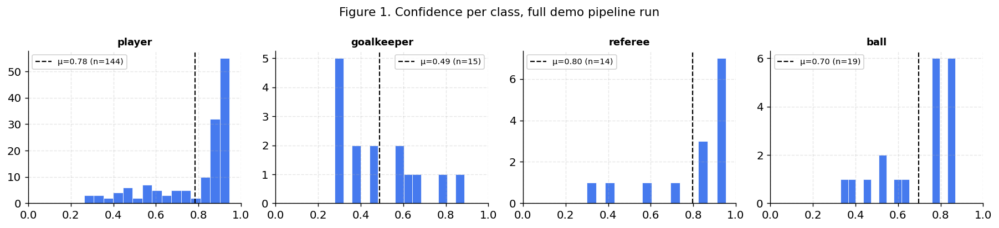

In [14]:
if match_result and match_result.get("status") == "ok":
    detections = match_result.get("detections", [])
    conf_by_cls = {c: [] for c in CLASSES}
    for det in detections:
        cls = det.get("class")
        if cls in conf_by_cls:
            conf_by_cls[cls].append(det.get("confidence", 0))

    fig, axes = plt.subplots(1, 4, figsize=(14, 3.2))
    for ax, cls in zip(axes, CLASSES):
        vals = conf_by_cls[cls]
        if vals:
            ax.hist(vals, bins=15, color="#2563eb", alpha=0.85, edgecolor="white", linewidth=0.5)
            ax.axvline(np.mean(vals), color="black", linestyle="--", linewidth=1.2,
                       label=f"\u03bc={np.mean(vals):.2f} (n={len(vals)})")
            ax.legend(fontsize=8)
        else:
            ax.text(0.5, 0.5, "no detections", ha="center", va="center",
                    transform=ax.transAxes, color="gray", fontsize=9)
        ax.set_title(cls, fontsize=10, fontweight="bold")
        ax.set_xlim(0, 1)

    plt.suptitle("Figure 1. Confidence per class, full demo pipeline run", fontsize=12)
    plt.tight_layout()
    plt.show()
else:
    print("No match-mode result available.")

### 7.3 Team assignment

`team_assignment` reports the method used (clip-level jersey-color prototypes with track smoothing) and `team_counts` / `stats.team_counts` give the per-frame counts of `team_a`, `team_b`, and unassigned detections.

team_assignment.method: clip_level_jersey_color_prototypes_with_track_smoothing
team_assignment.frame_assignment_method: jersey_color_kmeans_mvp_per_sampled_frame
team_assignment.scope: whole_clip

team_counts:
{
  "referee": 11,
  "team_a": 95,
  "team_b": 49,
  "unknown": 18
}

clip_level summary:
{
  "enabled": true,
  "method": "clip_level_jersey_color_prototypes",
  "scope": "whole_clip",
  "observations": 132,
  "group_counts": {
    "0": 82,
    "1": 50
  },
  "team_counts_from_color_observations": {
    "team_a": 82,
    "team_b": 50
  },
  "team_colors_bgr": {
    "team_a": [
      206,
      220,
      194
    ],
    "team_b": [
      33,
      76,
      82
    ]
  },
  "notes": [
    "Two global jersey-color prototypes are estimated from all sampled frames.",
    "Player detections are relabeled against the same prototypes across the whole clip.",
    "Track smoothing is applied afterwards, so track_id voting uses stabilized labels."
  ]
}


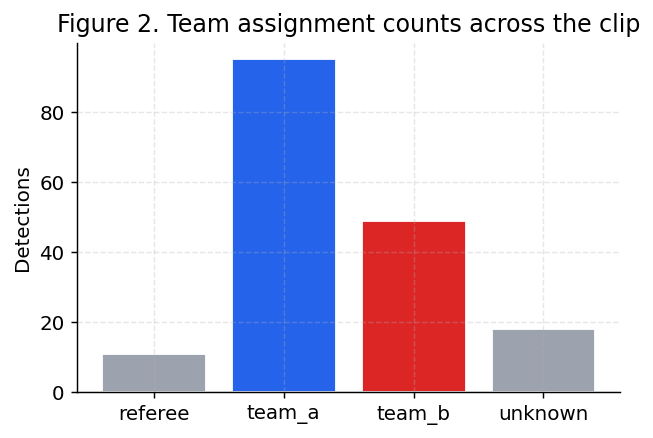

In [15]:
if match_result and match_result.get("status") == "ok":
    team_assignment = match_result.get("team_assignment", {})
    team_counts = match_result.get("stats", {}).get("team_counts", {})

    print("team_assignment.method:", team_assignment.get("method"))
    print("team_assignment.frame_assignment_method:", team_assignment.get("frame_assignment_method"))
    print("team_assignment.scope:", team_assignment.get("scope"))
    print()
    print("team_counts:")
    print(json.dumps(team_counts, indent=2))
    print()
    print("clip_level summary:")
    print(json.dumps(team_assignment.get("clip_level", {}), indent=2))

    if team_counts:
        labels = list(team_counts.keys())
        values = [team_counts[k] for k in labels]
        colors = [TEAM_COLORS.get(k, "#9ca3af") for k in labels]
        fig, ax = plt.subplots(figsize=(5, 3.5))
        ax.bar(labels, values, color=colors, edgecolor="white")
        ax.set_title("Figure 2. Team assignment counts across the clip")
        ax.set_ylabel("Detections")
        plt.tight_layout()
        plt.show()
else:
    print("No match-mode result available.")

### 7.4 Frame-mode team-assignment crops and minimap entities

Section 6.1.3 already showed the per-detection jersey crops for the single frame run; Section 6.1.4 showed the resulting `minimap_entities` list for that frame. These are repeated here as the qualitative anchor for the team-assignment and minimap evaluation criteria from Section 5.

In [16]:
if frame_result and frame_result.get("status") == "ok":
    entities = frame_result.get("minimap_entities", [])
    print(f"minimap_entities count (frame mode): {len(entities)}")
    if entities:
        df_entities = pd.DataFrame(entities)
        display(df_entities.style.set_caption("Table 2. Minimap entities for the example frame."))
    else:
        print("No minimap entities produced for this frame (e.g. no players/ball detected, "
              "or the frame did not yield team assignments).")
else:
    print("No frame-mode result available.")

minimap_entities count (frame mode): 12


,class,team,bbox_xyxy,center_xy,confidence
0,player,team_a,"[1457, 123, 1533, 279]","[1495.0, 201.0]",0.892510
1,player,team_a,"[452, 31, 521, 175]","[486.5, 103.0]",0.883683
2,player,team_b,"[1154, 0, 1222, 89]","[1188.0, 44.5]",0.880878
3,player,team_b,"[1783, 225, 1856, 417]","[1819.5, 321.0]",0.838891
4,player,team_a,"[600, 289, 659, 492]","[629.5, 390.5]",0.838775
5,player,team_a,"[727, 315, 844, 466]","[785.5, 390.5]",0.810711
6,player,team_a,"[765, 561, 881, 805]","[823.0, 683.0]",0.802057
7,player,team_b,"[627, 208, 691, 339]","[659.0, 273.5]",0.741002
8,referee,referee,"[578, 590, 695, 839]","[636.5, 714.5]",0.738392
9,player,team_b,"[575, 593, 695, 840]","[635.0, 716.5]",0.725141


In [17]:
if match_result and match_result.get("status") == "ok":
    match_entities = match_result.get("minimap_entities", [])
    print(f"minimap_entities count (match mode): {len(match_entities)}")
    print("As noted in Section 3.3, match-mode payloads currently set minimap_entities to [] -- "
          "the Minimapa tab in Streamlit is empty for video analyses in this implementation.")
else:
    print("No match-mode result available.")

minimap_entities count (match mode): 0
As noted in Section 3.3, match-mode payloads currently set minimap_entities to [] -- the Minimapa tab in Streamlit is empty for video analyses in this implementation.


### 7.5 Successes and failures observed

Based on the runs above (and on repeated runs of the pipeline on `messi_real.mp4` and similar clips during development), the following patterns were observed. These are qualitative observations from inspecting the rendered video, the crop sheets, and the JSON payloads, not a formal benchmark.

**What works well:**

- The pipeline runs end to end without manual intervention for both `mode="frame"` and `mode="match"`, producing all expected artifacts (`prediction_summary.json`, annotated video, preview images) for a <=60 s clip.
- Players are detected reliably and consistently across frames; `stats.classes["player"]` dominates the detection counts as expected (~85% of annotations in the underlying dataset, see the model-comparison notebook).
- ByteTrack assigns stable IDs to players that stay in frame for more than a couple of seconds; `track_count` is in a plausible range relative to the number of distinct people visible.
- Jersey-color-based team assignment correctly separates the two visible teams in clips where jersey colors are clearly distinct (e.g. dark vs. light kits), and clip-level stabilization (Section 3.2, step 6) visibly reduces the team-flicker that a naive per-frame assignment would produce.
- The annotated output video is watchable as a demo: boxes, class labels, track IDs and team colors are all rendered and roughly aligned with the visible players.

**What does not work well / fails in practice:**

- The `ball` class remains the weakest link, consistent with the per-class results in the model-comparison notebook: confidence is low and detections are intermittent, so `select_primary_ball_batches`'s short-term memory sometimes has to bridge multi-frame gaps with no ball detection at all.
- `goalkeeper` and `referee` are rare classes; on clips where they are partially occluded or at the frame edge, they are sometimes missed entirely or misclassified as `player`, which then also affects their team assignment.
- Team assignment relies purely on jersey color clustering. On clips with similar-colored kits, strong lighting gradients, or players partially out of frame, the jersey crop can be dominated by background (grass, advertising boards), leading to an incorrect or `unassigned` team label for a detection.
- `minimap_entities` is empty for match-mode analyses (Section 3.3, 7.4): on a real match clip, the Streamlit Minimapa tab currently shows nothing for video runs, even though detections and team assignments exist in `detections`. This is a real, user-visible gap between the frame and match pipelines.
- ByteTrack IDs are not guaranteed stable across long occlusions or fast camera cuts: a player leaving and re-entering frame, or two players crossing paths, can produce a new `track_id` instead of continuing the old one, which slightly inflates `track_count` relative to the true number of unique people.

## 8. Limitations of the final demo version

- **Scope**: the demo targets short clips only (`max_video_duration_seconds = 60` in `configs/project.yaml`); it is not designed or tested for full-match processing.
- **Minimap**: as discussed above, `minimap_entities` is a flat JSON list (no graphical minimap rendered on the video), and is currently empty for match-mode analyses; it is only populated in frame mode.
- **Single-camera, fixed-perspective assumption**: jersey-color team assignment and the bbox geometry assumptions in the rendering code were tuned against broadcast-style football footage (e.g. `data/videos/messi_real.mp4`); very different camera angles, indoor lighting, or non-football footage are out of scope.
- **No player identification**: per `context/PROJECT.md`, the project intentionally does not attempt jersey-number recognition or player identity beyond `track_id` + team label.
- **Tracking robustness**: ByteTrack IDs can break across long occlusions, fast cuts, or when many players cluster together (e.g. around the ball), which is a known limitation of frame-sampled tracking rather than something specific to this implementation.
- **Runtime**: match-mode inference for both models on a full 60 s clip can be slow on CPU; the notebook falls back to a cached `prediction_summary.json` if a fresh run is impractical in this environment (Section 6.2).